<a href="https://colab.research.google.com/github/stefan9988/satellite_image_building_detection/blob/main/Building_Mapping.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Building Mapping


In [ ]:
# import necessary libraries
import glob
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import random
import tifffile as tiff
from PIL import Image
import cv2
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dropout, UpSampling2D, Concatenate, BatchNormalization, Add
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint
# from tensorflow.keras import Model
# from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose, Concatenate, Dropout

In [ ]:
# connect google drive
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [ ]:
# set the working directory
import os
os.chdir(r'/content/gdrive/MyDrive/archive')

## Data preprocessing

In [ ]:
train_x = sorted(glob.glob('train/*_image.tif'))
train_y = sorted(glob.glob('train/*_label.tif'))
test_x = sorted(glob.glob('test/*_image.tif'))
test_y = sorted(glob.glob('test/*_label.tif'))

print(len(train_x), len(test_x))

70 30


In [ ]:
# converting training images to numpy array
train_xx = np.zeros((70, 128, 128, 3))
train_yy = np.zeros((70, 128, 128, 1))
for i, (img, mask) in enumerate(zip(train_x, train_y)):
  # if i == 1:
  #   break

  img = Image.open(img)
  np_img = np.array(img)
  train_xx[i] = np_img

  mask = Image.open(mask)
  np_mask = np.array(mask).reshape(128, 128, 1)
  train_yy[i] = np_mask

In [ ]:
# converting test images to numpy array
test_xx = np.zeros((30, 128, 128, 3))
test_yy = np.zeros((30, 128, 128, 1))
for i, (img, mask) in enumerate(zip(test_x, test_y)):

  img = Image.open(img)
  np_img = np.array(img)
  test_xx[i] = np_img

  mask = Image.open(mask)
  np_mask = np.array(mask).reshape(128, 128, 1)
  test_yy[i] = np_mask

In [ ]:
# plt.imshow(train_xx[20, :, :, :].astype('uint8'))
# plt.show()
# plt.imshow(train_yy[20, :, :, 0].astype('uint8'))
# plt.show()

## Image augmentation

In [ ]:
def augment_image(image_1, image_2, flip=True, rotate=True, zoom=True):
    # Flip the image horizontally
    if flip:
        image_1 = cv2.flip(image_1, 1)
        image_2 = cv2.flip(image_2, 1)
        image_2 = image_2[:, :, np.newaxis]

    # Rotate the image by a random angle between -45 and 45 degrees
    if rotate:
        angle = np.random.uniform(-45, 45)

        rows, cols, _ = image_1.shape
        rotation_matrix = cv2.getRotationMatrix2D((cols / 2, rows / 2), angle, 1)
        image_1 = cv2.warpAffine(image_1, rotation_matrix, (cols, rows))

        rows, cols, _ = image_2.shape
        rotation_matrix = cv2.getRotationMatrix2D((cols / 2, rows / 2), angle, 1)
        image_2 = cv2.warpAffine(image_2, rotation_matrix, (cols, rows))
        image_2 = image_2[:, :, np.newaxis]

    # Zoom into the image by a random factor between 1.0 and 1.5
    if zoom:
        zoom_factor = np.random.uniform(1.0, 1.5)

        rows, cols, _ = image_1.shape
        zoom_matrix = np.array([[zoom_factor, 0, (1 - zoom_factor) * cols / 2],
                                [0, zoom_factor, (1 - zoom_factor) * rows / 2]])
        image_1 = cv2.warpAffine(image_1, zoom_matrix, (cols, rows))

        rows, cols, _ = image_2.shape
        zoom_matrix = np.array([[zoom_factor, 0, (1 - zoom_factor) * cols / 2],
                                [0, zoom_factor, (1 - zoom_factor) * rows / 2]])
        image_2 = cv2.warpAffine(image_2, zoom_matrix, (cols, rows))
        image_2 = image_2[:, :, np.newaxis]

    return image_1, image_2

In [ ]:
# augmented_image_1, augmented_image_2 = augment_image(train_xx[20, :, :, :], train_yy[20, :, :, :], 1,1,1)

In [ ]:
# plt.imshow(augmented_image_1.astype('uint8'))
# plt.show()
# plt.imshow(augmented_image_2.astype('uint8'))
# plt.show()

In [ ]:
# n=500
# augmented_train_xx = np.zeros((n,128,128,3))
# augmented_train_yy = np.zeros((n,128,128,1))

# for i in range(n):
#   img_number = random.randint(0, 69)
#   augmented_image_1, augmented_image_2 = augment_image(train_xx[img_number, :, :, :], train_yy[img_number, :, :, :], random.choice([0, 1]),random.choice([0, 1]),random.choice([0, 1]))
#   augmented_train_xx[i,:,:,:] = augmented_image_1
#   augmented_train_yy[i,:,:,:] = augmented_image_2

In [ ]:
# for i in range(0,500,100):
#   plt.imshow(augmented_train_xx[i, :, :, :].astype('uint8'))
#   plt.show()
#   plt.imshow(augmented_train_yy[i, :, :, 0].astype('uint8'))
#   plt.show()

## Create model

In [ ]:
def create_model():
  x_in = tf.keras.layers.Input(shape=(128, 128, 3))

  '''Encoder'''
  x_temp = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x_in)
  x_temp = tf.keras.layers.Dropout(0.25)(x_temp)
  x_skip1 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x_temp)
  x_temp = tf.keras.layers.MaxPooling2D((2,2))(x_skip1)
  x_temp = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x_temp)
  x_temp = tf.keras.layers.Dropout(0.25)(x_temp)
  x_skip2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x_temp)
  x_temp = tf.keras.layers.MaxPooling2D((2,2))(x_skip2)
  x_temp = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x_temp)
  x_temp = tf.keras.layers.Dropout(0.25)(x_temp)
  x_skip3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x_temp)
  x_temp = tf.keras.layers.MaxPooling2D((2,2))(x_skip3)
  x_temp = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x_temp)
  x_temp = tf.keras.layers.Dropout(0.5)(x_temp)
  x_temp = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x_temp)

  '''Decoder'''
  x_temp = tf.keras.layers.Conv2DTranspose(64, (3, 3), activation='relu',  padding='same')(x_temp)
  x_temp = tf.keras.layers.Dropout(0.5)(x_temp)
  x_temp = tf.keras.layers.Conv2DTranspose(64, (3, 3), strides=(2, 2), activation='relu',  padding='same')(x_temp)
  x_temp = tf.keras.layers.Concatenate()([x_temp, x_skip3])
  x_temp = tf.keras.layers.Conv2DTranspose(64, (3, 3), activation='relu',  padding='same')(x_temp)
  x_temp = tf.keras.layers.Dropout(0.5)(x_temp)
  x_temp = tf.keras.layers.Conv2DTranspose(64, (3, 3), strides=(2, 2), activation='relu',  padding='same')(x_temp)
  x_temp = tf.keras.layers.Concatenate()([x_temp, x_skip2])
  x_temp = tf.keras.layers.Conv2DTranspose(32, (3, 3), activation='relu',  padding='same')(x_temp)
  x_temp = tf.keras.layers.Dropout(0.5)(x_temp)
  x_temp = tf.keras.layers.Conv2DTranspose(32, (3, 3), strides=(2, 2), activation='relu',  padding='same')(x_temp)
  x_temp = tf.keras.layers.Concatenate()([x_temp, x_skip1])
  x_temp = tf.keras.layers.Conv2DTranspose(32, (3, 3), activation='relu',  padding='same')(x_temp)
  x_temp = tf.keras.layers.Dropout(0.5)(x_temp)
  x_temp = tf.keras.layers.Conv2DTranspose(32, (3, 3), activation='relu',  padding='same')(x_temp)

  '''Use 1 by 1 Convolution to get desired output bands'''
  x_temp = tf.keras.layers.Conv2D(32, (1, 1), activation='relu', padding='same')(x_temp)
  x_temp = tf.keras.layers.Conv2D(32, (1, 1), activation='relu', padding='same')(x_temp)
  x_out = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid', padding='same')(x_temp)
  # use sigmoid activation here because output values are either 0 or 1

  model = tf.keras.models.Model(inputs=x_in, outputs=x_out)

  return model

In [ ]:
# from tensorflow.keras.models import Model
# from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose

# def build_unet(input_shape=(128, 128, 3)):
#     inputs = Input(input_shape)

#     # Encoder
#     conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
#     conv1 = Conv2D(64, 3, activation='relu', padding='same')(conv1)
#     pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

#     conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
#     conv2 = Conv2D(128, 3, activation='relu', padding='same')(conv2)
#     pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

#     conv3 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
#     conv3 = Conv2D(256, 3, activation='relu', padding='same')(conv3)
#     pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

#     # Bottleneck
#     conv4 = Conv2D(512, 3, activation='relu', padding='same')(pool3)
#     conv4 = Conv2D(512, 3, activation='relu', padding='same')(conv4)

#     # Decoder
#     up5 = concatenate([UpSampling2D(size=(2, 2))(conv4), conv3], axis=-1)
#     conv5 = Conv2D(256, 3, activation='relu', padding='same')(up5)
#     conv5 = Conv2D(256, 3, activation='relu', padding='same')(conv5)

#     up6 = concatenate([UpSampling2D(size=(2, 2))(conv5), conv2], axis=-1)
#     conv6 = Conv2D(128, 3, activation='relu', padding='same')(up6)
#     conv6 = Conv2D(128, 3, activation='relu', padding='same')(conv6)

#     up7 = concatenate([UpSampling2D(size=(2, 2))(conv6), conv1], axis=-1)
#     conv7 = Conv2D(64, 3, activation='relu', padding='same')(up7)
#     conv7 = Conv2D(64, 3, activation='relu', padding='same')(conv7)

#     # Output layer
#     output = Conv2D(1, 1, activation='sigmoid')(conv7)

#     model = Model(inputs=inputs, outputs=output)

#     return model



In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPooling2D, UpSampling2D, concatenate, Dropout

def conv_block(inputs, filters, kernel_size=3, batch_norm=True, dropout_rate=0.2):
    x = Conv2D(filters, kernel_size, padding='same')(inputs)
    if batch_norm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)
    if dropout_rate > 0:
        x = Dropout(dropout_rate)(x)
    return x

def build_unet(input_shape=(128, 128, 3)):
    inputs = Input(input_shape)

    # Encoder
    conv1 = conv_block(inputs, 64)
    conv1 = conv_block(conv1, 64)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = conv_block(pool1, 128)
    conv2 = conv_block(conv2, 128)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = conv_block(pool2, 256)
    conv3 = conv_block(conv3, 256)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    # Bottleneck
    conv4 = conv_block(pool3, 512)
    conv4 = conv_block(conv4, 512)

    # Decoder
    up5 = concatenate([UpSampling2D(size=(2, 2))(conv4), conv3], axis=-1)
    conv5 = conv_block(up5, 256)
    conv5 = conv_block(conv5, 256)

    up6 = concatenate([UpSampling2D(size=(2, 2))(conv5), conv2], axis=-1)
    conv6 = conv_block(up6, 128)
    conv6 = conv_block(conv6, 128)

    up7 = concatenate([UpSampling2D(size=(2, 2))(conv6), conv1], axis=-1)
    conv7 = conv_block(up7, 64)
    conv7 = conv_block(conv7, 64)

    # Output layer
    output = Conv2D(1, 1, activation='sigmoid')(conv7)

    model = Model(inputs=inputs, outputs=output)

    return model


## Test model

In [ ]:
# model = build_unet(input_shape=(128, 128, 3))

In [ ]:
# model.summary()

In [ ]:
# model.compile(loss='binary_crossentropy', optimizer='adam')

In [ ]:
# checkpoint_callback = ModelCheckpoint(
#     filepath='best_test_model_weights_no_aug.h5',
#     monitor='val_loss',
#     save_best_only=True,
#     mode='min',
#     verbose=1
# )

In [ ]:
# # training model
# # history = model.fit(augmented_train_xx, augmented_train_yy, validation_data=(test_xx, test_yy), epochs=150, batch_size=50, callbacks=[checkpoint_callback], verbose=1)
# history = model.fit(train_xx, train_yy, validation_data=(test_xx, test_yy), epochs=125, batch_size=10, callbacks=[checkpoint_callback], verbose=1)

In [ ]:
# # plot model loss over training and validation data
# plt.plot(history.history['loss'])
# plt.plot(history.history['val_loss'])
# plt.title('Model Loss')
# plt.ylabel('Loss')
# plt.xlabel('Epoch')
# plt.legend(['Train', 'Test'], loc='upper left')
# plt.show()

# Prediction

In [ ]:
# threshold = 0.5
# im = 12

# # prediction of the output
# pred_test = model.predict(test_xx)
# pred_test = (pred_test > threshold).astype(np.uint8)
# print(pred_test.shape)

# #let's comare random predicted and actial y values
# plt.imshow(pred_test[im, :, :, 0])
# plt.show()
# plt.imshow(test_yy[im,:,:,0])
# plt.show()

## Main Model Training

In [ ]:
xx = result = np.concatenate((train_xx, test_xx), axis=0)
yy = result = np.concatenate((train_yy, test_yy), axis=0)

In [ ]:
n=7000
augmented_xx = np.zeros((n,128,128,3))
augmented_yy = np.zeros((n,128,128,1))

for i in range(n):
  img_number = random.randint(0, 99)
  augmented_image_1, augmented_image_2 = augment_image(xx[img_number, :, :, :], yy[img_number, :, :, :], random.choice([0, 1]),random.choice([0, 1]),random.choice([0, 1]))
  augmented_xx[i,:,:,:] = augmented_image_1
  augmented_yy[i,:,:,:] = augmented_image_2

In [ ]:
checkpoint_callback = ModelCheckpoint(
    filepath='aug_model_weights.h5',
    monitor='val_loss',
    # monitor='loss',
    save_best_only=True,
    mode='min',
    verbose=1
)

In [ ]:
model = create_model()
# model = build_unet(input_shape=(128, 128, 3))
model.compile(loss='binary_crossentropy', optimizer='adam')

In [ ]:
# training model
history = model.fit(augmented_xx[:6000,:,:,:], augmented_yy[:6000,:,:,:], validation_data=(augmented_xx[6000:,:,:,:], augmented_yy[6000:,:,:,:]), epochs=100, batch_size=50, callbacks=[checkpoint_callback], verbose=1)

Epoch 1/100
120/120 [==============================] - ETA: 0s - loss: 0.4809
Epoch 1: val_loss improved from inf to 0.46014, saving model to aug_model_weights.h5
120/120 [==============================] - 46s 235ms/step - loss: 0.4809 - val_loss: 0.4601
Epoch 2/100


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


120/120 [==============================] - ETA: 0s - loss: 0.3452
Epoch 2: val_loss improved from 0.46014 to 0.41282, saving model to aug_model_weights.h5
120/120 [==============================] - 28s 237ms/step - loss: 0.3452 - val_loss: 0.4128
Epoch 3/100
120/120 [==============================] - ETA: 0s - loss: 0.2673
Epoch 3: val_loss improved from 0.41282 to 0.33611, saving model to aug_model_weights.h5
120/120 [==============================] - 28s 237ms/step - loss: 0.2673 - val_loss: 0.3361
Epoch 4/100
120/120 [==============================] - ETA: 0s - loss: 0.2320
Epoch 4: val_loss did not improve from 0.33611
120/120 [==============================] - 27s 226ms/step - loss: 0.2320 - val_loss: 0.3589
Epoch 5/100
120/120 [==============================] - ETA: 0s - loss: 0.2126
Epoch 5: val_loss did not improve from 0.33611
120/120 [==============================] - 28s 230ms/step - loss: 0.2126 - val_loss: 0.3777
Epoch 6/100
120/120 [==============================] - ETA: 

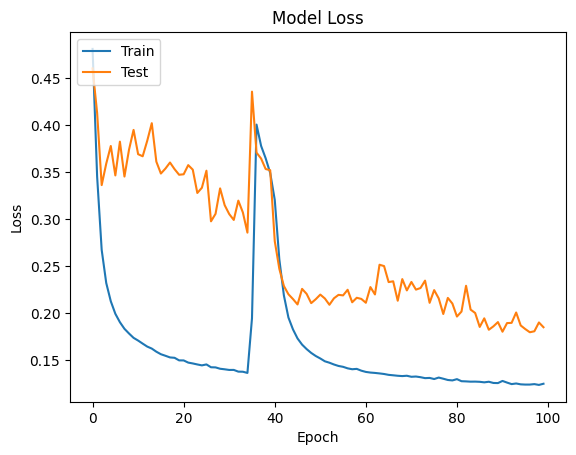

In [ ]:
# plot model loss over training and validation data
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

## NS image


In [ ]:
# Assuming you have the path to the image stored in 'ns'
ns_path = '/content/gdrive/MyDrive/archive/SnimakNS.tif'

# Load the image using PIL
img = tiff.imread(ns_path)

# Convert the image to a NumPy array
ns_array = np.array(img)

# Print the shape, minimum, and maximum values
print("Shape of the array:", ns_array.shape)
print("Minimum value:", np.min(ns_array))
print("Maximum value:", np.max(ns_array))

Shape of the array: (5911, 10657, 5)
Minimum value: 0
Maximum value: 255


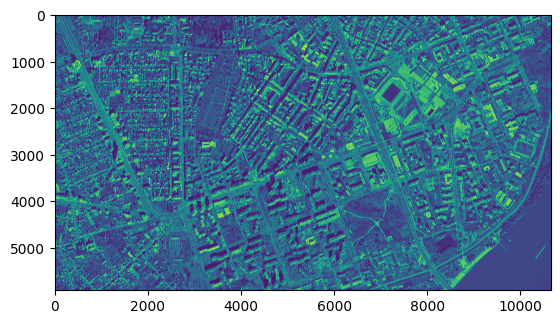

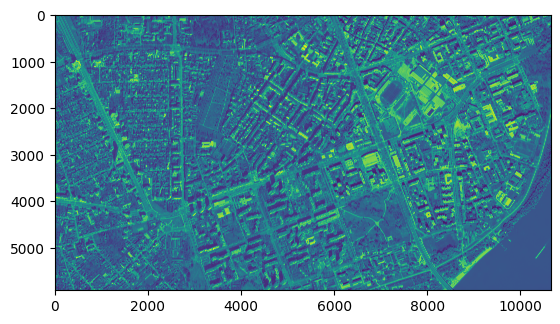

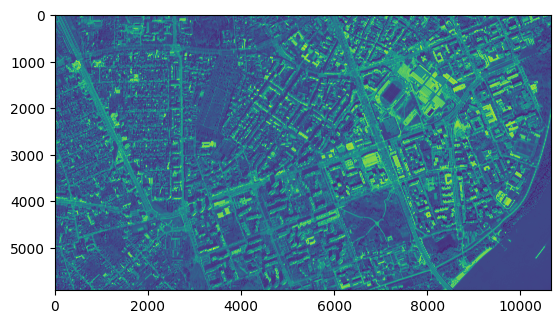

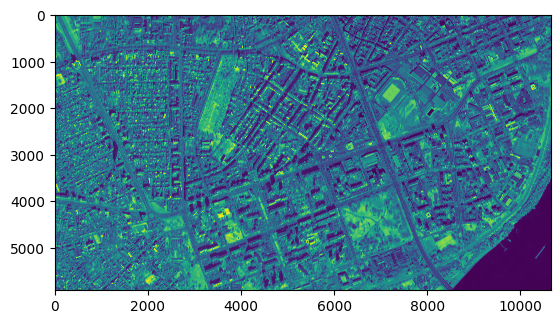

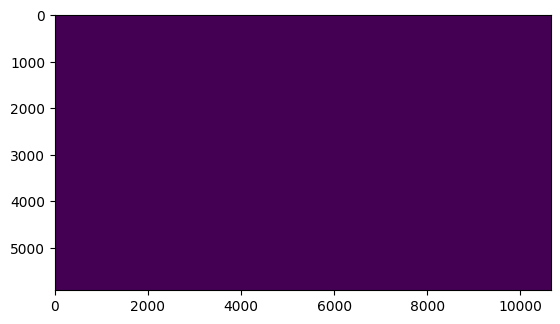

In [ ]:
for i in range(5):
  plt.imshow(ns_array[:, :, i])
  plt.show()

# 5 ti kanal ima vrednost 255 za svaki piksel

In [ ]:
def split_image(input_image_path, size=128):
    img = tiff.imread(input_image_path)
    height, width, num_channels = img.shape

    num_rows = height // size
    num_cols = width // size

    result_array = np.zeros((num_rows * num_cols, size, size, num_channels), dtype=img.dtype)

    idx = 0
    for row in range(num_rows):
        for col in range(num_cols):
            left = col * size
            top = row * size
            right = left + size
            bottom = top + size

            for channel in range(num_channels):
                cropped_img = img[top:bottom, left:right, channel]
                result_array[idx, :, :, channel] = cropped_img

            # plt.imshow(result_array[idx,:,:,:3])
            # plt.show()
            idx += 1

    return result_array[:,:,:,:3],num_rows,num_cols

In [ ]:
def reconstruct_image(result_array, num_rows, num_cols, size=128):
    num_samples, size, _, num_channels = result_array.shape

    reconstructed_image = np.zeros((num_rows * size, num_cols * size, num_channels), dtype=result_array.dtype)

    idx = 0
    for row in range(num_rows):
        for col in range(num_cols):
            left = col * size
            top = row * size
            right = left + size
            bottom = top + size

            for channel in range(num_channels):
                cropped_img = result_array[idx, :, :, channel]
                reconstructed_image[top:bottom, left:right, channel] = cropped_img

            idx += 1

    return reconstructed_image

In [ ]:
def save_img(sample_array,img_name,grayscale = False):
  if grayscale:
    sample_array = sample_array * 255
    image = Image.fromarray(sample_array.squeeze(), mode='L')
  else:
    image = Image.fromarray(sample_array.astype('uint8'))

  image.save(f'{img_name}.png')

In [ ]:
ns_splited,num_rows,num_cols = split_image(ns_path)
print(ns_splited.shape)

(3818, 128, 128, 3)


In [ ]:
model = create_model()
# model = build_unet(input_shape=(128, 128, 3))
model.load_weights('aug_model_weights.h5')

In [ ]:
threshold = 0.5

# prediction of the output
pred_ns = model.predict(ns_splited)
pred_ns = (pred_ns > threshold).astype(np.uint8)

120/120 [==============================] - 261s 2s/step


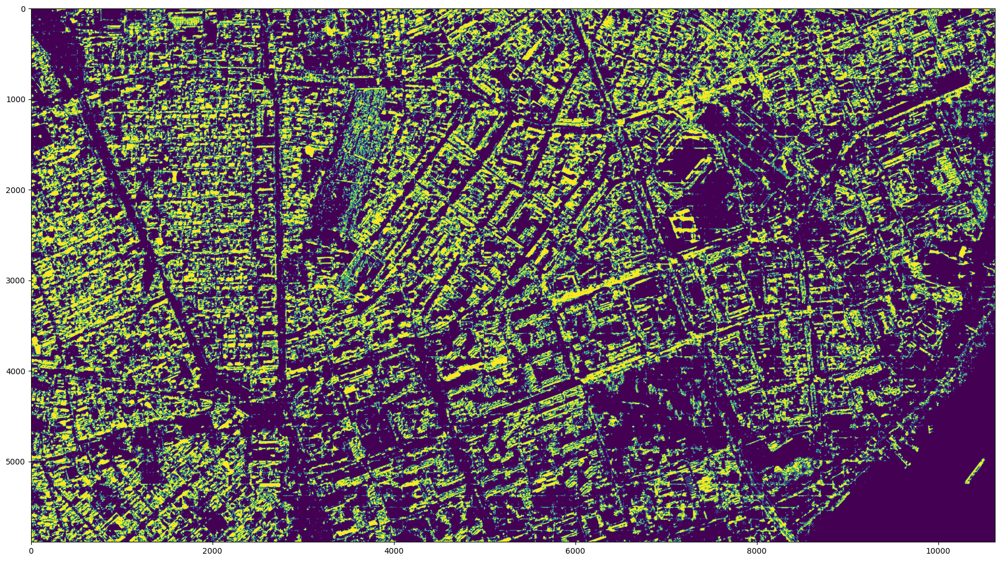

In [ ]:
reconstructed_image = reconstruct_image(pred_ns,num_rows,num_cols)
plt.figure(figsize=(22, 20))
plt.imshow(reconstructed_image)
plt.show()
save_img(reconstructed_image,'NS_th_05_aug', True)

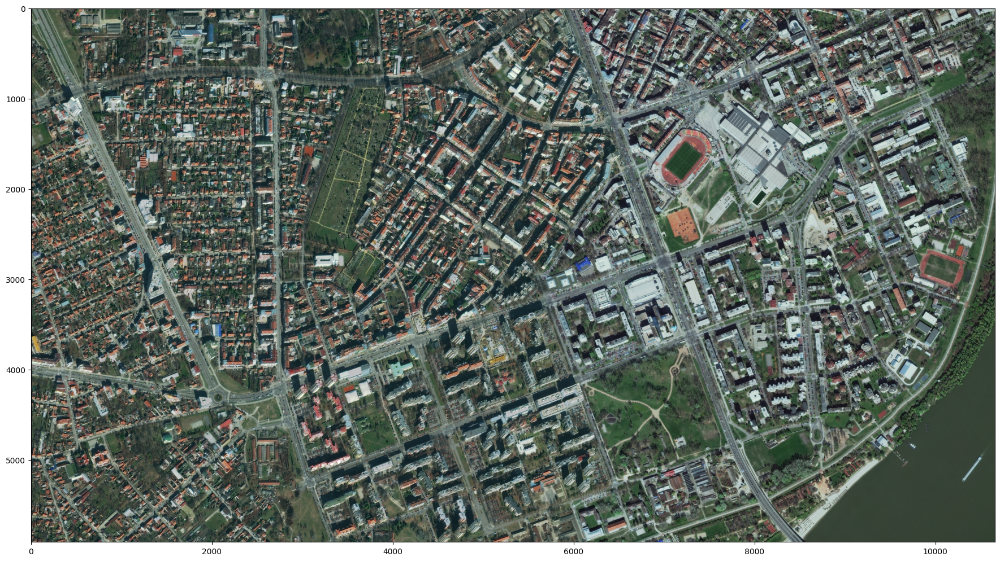

In [ ]:
plt.figure(figsize=(22, 20))
plt.imshow(ns_array[:, :, :3])
plt.show()
# save_img(ns_array[:, :, :3],'NS_RGB')

## Filtering


In [ ]:
import cv2
import numpy as np

def remove_noise_binary(image_path, kernel_size=3, save_path=None):
    # Read the binary image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Apply a median filter to remove noise
    filtered_image = cv2.medianBlur(image, kernel_size)

    # Threshold the filtered image to get a binary result
    _, binary_result = cv2.threshold(filtered_image, 127, 255, cv2.THRESH_BINARY)

    if save_path:
        cv2.imwrite(save_path, binary_result)


    return binary_result

In [ ]:
from google.colab.patches import cv2_imshow
# Example usage:
input_image_path = 'NS_th_05_aug.png'
output_image = remove_noise_binary(input_image_path, 15, 'NS_th_05_aug_filtered.png')

cv2_imshow(output_image)
cv2.waitKey(0)
cv2.destroyAllWindows()